# E-18. 문자를 읽을 수 있는 딥러닝  

 `Google OCR API`, `keras-ocr`, `Tesseract` 3가지의 OCR 모델 비교(검증)    


---
## Step1. 검증용 데이터셋 준비

20장 이하를 사용하는 조건에 따라 테스트용 이미지를 **총 10장** 준비하였습니다.  

도서명을 인식하는 기능을 얼마나 잘 수행하는지 확인하고자 합니다.  
최근 책 표지의 디자인이 다양해지면서 책 제목에 대한 표기도 다채로워졌습니다.  
이에 따라 책의 제목을 정확히 인식할 수 있을지 검증해보고자 합니다.

In [81]:
import os
import matplotlib.pyplot as plt
import keras_ocr
import pytesseract
from PIL import Image
from pytesseract import Output
import matplotlib.image as img
import glob
import pandas as pd

In [82]:
img_dir = os.getenv('HOME')+'/aiffel/ocr_python/images'
images = os.listdir(img_dir)
images.remove('.ipynb_checkpoints')
images = sorted(images)
images

['01.jpg',
 '02.jpg',
 '03.jpg',
 '04.png',
 '05.png',
 '06.jpg',
 '07.png',
 '08.png',
 '09.png',
 '10.png']

In [83]:
images_path = []
for image in images:
    path = img_dir+'/'+str(image)
    images_path.append(path)
images_path = sorted(images_path)
images_path

['/aiffel/aiffel/ocr_python/images/01.jpg',
 '/aiffel/aiffel/ocr_python/images/02.jpg',
 '/aiffel/aiffel/ocr_python/images/03.jpg',
 '/aiffel/aiffel/ocr_python/images/04.png',
 '/aiffel/aiffel/ocr_python/images/05.png',
 '/aiffel/aiffel/ocr_python/images/06.jpg',
 '/aiffel/aiffel/ocr_python/images/07.png',
 '/aiffel/aiffel/ocr_python/images/08.png',
 '/aiffel/aiffel/ocr_python/images/09.png',
 '/aiffel/aiffel/ocr_python/images/10.png']

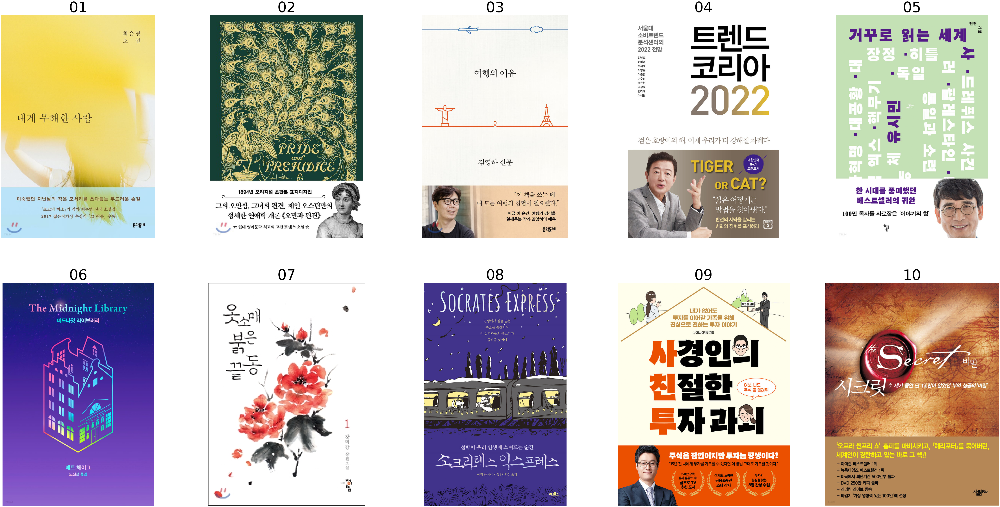

In [84]:
plt.figure(figsize=(100, 50))

for i, image in enumerate(images_path,1):
    plt.subplot(2, 5, i)
    plt.imshow(img.imread(image))
    plt.title(images[i-1][:2], fontsize= 80)
    plt.axis('off')

----
## Step2. 3가지 OCR 모델 테스트

`Google OCR API`, `keras-ocr`, `Tesseract` 모델 테스트 진행  

### 구글 OCR API

In [85]:
def detect_text(path):
    """Detects text in the file."""
    from google.cloud import vision
    import io
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('='*25)
    
    for text in texts:
        print("{}".format(text.description), end=',')
    print()
    
#     vertices = (['({},{})'.format(vertex.x, vertex.y)
#                  for vertex in text.bounding_poly.vertices])

#     print('bounds: {}'.format(','.join(vertices)))

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))

In [86]:
!ls -l $GOOGLE_APPLICATION_CREDENTIALS

import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] =  os.getenv('HOME')+'/aiffel/ocr_python/my_google_api_key.json'

-rw-r--r-- 1 root root 2333 Dec  2 17:32 /aiffel/aiffel/ocr_python/my_google_api_key.json


In [87]:
images_path

['/aiffel/aiffel/ocr_python/images/01.jpg',
 '/aiffel/aiffel/ocr_python/images/02.jpg',
 '/aiffel/aiffel/ocr_python/images/03.jpg',
 '/aiffel/aiffel/ocr_python/images/04.png',
 '/aiffel/aiffel/ocr_python/images/05.png',
 '/aiffel/aiffel/ocr_python/images/06.jpg',
 '/aiffel/aiffel/ocr_python/images/07.png',
 '/aiffel/aiffel/ocr_python/images/08.png',
 '/aiffel/aiffel/ocr_python/images/09.png',
 '/aiffel/aiffel/ocr_python/images/10.png']

In [88]:
# 위에서 정의한 OCR API 이용 함수를 호출해 봅시다.
for path in images_path:
    detect_text(path)

최은영
소 설
내게 무해한 사람
미숙했던 지난날의 작은 모서리를 쓰다듬는 부드러운 손길
「쇼코의 미소」의 작가 최은영 신작 소설집
2017 젊은작가상 수상작 「그 여름」 수록
문학동네
YES24
,최은영,소,설,내게,무해한,사람,미숙,했던,지난날,의,작은,모서리,를,쓰다듬는,부드러운,손길,「,쇼코,의,미소,」,의,작가,최은영,신작,소설집,2017,젊은,작가상,수상작,「,그,여름,」,수록,문학,동네,YES24,
PRIDE
PREFUDICE
and
1894년 오리지널 초판본 표지디자인
그의 오만함, 그녀의 편견. 제인 오스틴만의
섬세한 연애학 개론《오만과 편견》
☆ 현대 영미문학 최고의 고전로맨스 소설 ☆
YES24
,PRIDE,PREFUDICE,and,1894,년,오리지널,초판본,표지,디자인,그의,오만함,,,그녀,의,편견,.,제인,오스틴,만,의,섬세한,연애학,개론,《,오만,과,편견,》,☆,현대,영미,문학,최고의,고전,로맨스,소설,☆,YES24,
여행의 이유
김영하 산문
"이 책을 쓰는 데
내 모든 여행의 경험이 필요했다."
지금 이 순간, 여행의 감각을
일깨우는 작가 김영하의 매혹
문학동네
,여행,의,이유,김영하,산문,",이,책,을,쓰는,데,내,모든,여행,의,경험,이,필요,했다,.,",지금,이,순간,,,여행,의,감각,을,일깨우는,작가,김영하,의,매혹,문학,동네,
- 트렌드
코리아
2022
서울대
소비트렌드
분석센터의
2022 전망
김난도
전미영
최지혜
이향은
이준영
이수진
서유현
권정윤
한다혜
이혜원
검은호랑이의 해, 이제 우리가더 강해질 차례다
대한민국
TIGER
No.1
트렌드서
OR CAT?
"삶은어떻게든
방법을 찾아낸다."
반전의 서막을 알리는
변화의 징후를 포착하라
미래의
,-,트렌드,코리아,2022,서울대,소비,트렌드,분석,센터,의,2022,전망,김난도,전미영,최지혜,이향,은,이준영,이수진,서유현,권정윤,한다혜,이혜원,검은,호랑이,의,해,,,이제,우리,가,더,강해질,차례,다,대한민국,TIGER,No.1,트렌드,서,OR,CAT?,",삶은,어떻게,든,방법

###  keras-ocr

In [89]:
# keras-ocr이 detector과 recognizer를 위한 모델을 자동으로 다운로드받게 됩니다. 
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


In [90]:
images2 = [keras_ocr.tools.read(os.path.join(img_dir, image)) for image in images]
prediction_groups = [pipeline.recognize([os.path.join(img_dir, image)]) for image in images]

/opt/conda/lib/python3.7/site-packages/keras_ocr/tools.py:166: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  horizontalalignment='right' if side == 'left' else 'left')


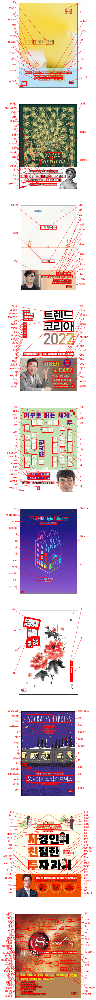

In [91]:
# Plot the predictions
fig, axs = plt.subplots(nrows=len(images2), figsize=(50, 100))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=images2[idx], 
                                    predictions=prediction_groups[idx][0], ax=ax)

### Tesseract
OCR Engine modes(–oem):  
0 - Legacy engine only.  
1 - Neural nets LSTM engine only.  
2 - Legacy + LSTM engines.  
3 - Default, based on what is available.  

Page segmentation modes(–psm):  
0 - Orientation and script detection (OSD) only.  
1 - Automatic page segmentation with OSD.  
2 - Automatic page segmentation, but no OSD, or OCR.  
3 - Fully automatic page segmentation, but no OSD. (Default)  
4 - Assume a single column of text of variable sizes.  
5 - Assume a single uniform block of vertically aligned text.  
6 - Assume a single uniform block of text.  
7 - Treat the image as a single text line.  
8 - Treat the image as a single word.  
9 - Treat the image as a single word in a circle.  
10 - Treat the image as a single character.  
11 - Sparse text. Find as much text as possible in no particular order.  
12 - Sparse text with OSD.  
13 - Raw line. Treat the image as a single text line, bypassing hacks that are Tesseract-specific.  


In [120]:
def crop_word_regions(image_path='./images/sample.png', output_path='./output'):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)

    recognized_data = pytesseract.image_to_data(
        image, lang='kor',    # 한국어라면 lang='kor'
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
            print(output_img_path)
            cropped_image = image.crop((
                left,
                top,
                left+width,
                top+height
            ))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1
    return cropped_image_path_list


In [121]:
def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang='kor',    # 한국어라면 lang='kor'
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data['text'].strip(), end=',')
    print()
    print('='*25)

In [122]:
save_dir =  os.getenv('HOME')+'/aiffel/ocr_python/save'
cropped_image_path_list2 = []
for path in images_path:
    try:
        cropped_image_path_list2.append(crop_word_regions(path, save_dir))
    except:
        print(f'fail: {path}')

/aiffel/aiffel/ocr_python/save/0000.png
/aiffel/aiffel/ocr_python/save/0001.png
/aiffel/aiffel/ocr_python/save/0002.png
/aiffel/aiffel/ocr_python/save/0003.png
/aiffel/aiffel/ocr_python/save/0004.png
/aiffel/aiffel/ocr_python/save/0005.png
/aiffel/aiffel/ocr_python/save/0006.png
/aiffel/aiffel/ocr_python/save/0007.png
/aiffel/aiffel/ocr_python/save/0008.png
/aiffel/aiffel/ocr_python/save/0000.png
/aiffel/aiffel/ocr_python/save/0001.png
/aiffel/aiffel/ocr_python/save/0002.png
/aiffel/aiffel/ocr_python/save/0003.png
/aiffel/aiffel/ocr_python/save/0004.png
/aiffel/aiffel/ocr_python/save/0005.png
/aiffel/aiffel/ocr_python/save/0006.png
/aiffel/aiffel/ocr_python/save/0007.png
/aiffel/aiffel/ocr_python/save/0008.png
/aiffel/aiffel/ocr_python/save/0009.png
/aiffel/aiffel/ocr_python/save/0010.png
/aiffel/aiffel/ocr_python/save/0011.png
/aiffel/aiffel/ocr_python/save/0012.png
/aiffel/aiffel/ocr_python/save/0013.png
/aiffel/aiffel/ocr_python/save/0014.png
/aiffel/aiffel/ocr_python/save/0015.png


/aiffel/aiffel/ocr_python/save/0003.png
/aiffel/aiffel/ocr_python/save/0004.png
/aiffel/aiffel/ocr_python/save/0005.png
/aiffel/aiffel/ocr_python/save/0006.png
/aiffel/aiffel/ocr_python/save/0007.png
/aiffel/aiffel/ocr_python/save/0008.png
/aiffel/aiffel/ocr_python/save/0009.png
fail: /aiffel/aiffel/ocr_python/images/06.jpg
/aiffel/aiffel/ocr_python/save/0000.png
/aiffel/aiffel/ocr_python/save/0001.png
/aiffel/aiffel/ocr_python/save/0002.png
fail: /aiffel/aiffel/ocr_python/images/07.png
/aiffel/aiffel/ocr_python/save/0000.png
/aiffel/aiffel/ocr_python/save/0001.png
/aiffel/aiffel/ocr_python/save/0002.png
/aiffel/aiffel/ocr_python/save/0003.png
/aiffel/aiffel/ocr_python/save/0004.png
/aiffel/aiffel/ocr_python/save/0005.png
/aiffel/aiffel/ocr_python/save/0006.png
/aiffel/aiffel/ocr_python/save/0007.png
/aiffel/aiffel/ocr_python/save/0008.png
/aiffel/aiffel/ocr_python/save/0009.png
/aiffel/aiffel/ocr_python/save/0010.png
/aiffel/aiffel/ocr_python/save/0011.png
/aiffel/aiffel/ocr_python/sa

In [123]:
for crop_image_path in cropped_image_path_list2:
    recognize_images(crop_image_path)

0 …-,~ ,,-,18,만0,),알있,,오이 0,
0 …-,~ ,,-,18,만0,),알있,,오이 0,[가설,. 0 :,=,아마존,베스트셀러,1,위,~,,뉴욕타운,이즈,베스트셀러,,1위,5,미,,국에서,,최단,기간,65(0(),빈,「부,돌파,00,,1040),25,0만,카피,돌파,00,,래리,킹,라이브,방송,사리,,17,“~,타임ㅅ,|,/,[삼,영향력,있는,10(),
0 …-,~ ,,-,18,만0,
0 …-,~ ,,-,18,만0,),알있,,오이 0,[가설,. 0 :,=,아마존,베스트셀러,1,위,~,,뉴욕타운,이즈,베스트셀러,,1위,5,미,,국에서,,최단,기간,65(0(),빈,「부,돌파,00,,1040),25,0만,카피,돌파,00,,래리,킹,라이브,방송,사리,,17,“~,타임ㅅ,|,/,[삼,영향력,있는,10(),인,7”,에,선정,0,,55.,게든,,방,범,고,찾ㅇ,2,개,비,도,이,| 서,|,2,이 느근,=,[|,4,「.깨,23,2,0,그,하그,|,내 |,
0 …-,~ ,,-,18,만0,),알있,,오이 0,[가설,. 0 :,=,아마존,베스트셀러,1,위,~,,뉴욕타운,이즈,베스트셀러,,1위,5,미,,국에서,,최단,기간,65(0(),빈,「부,돌파,00,,1040),25,0만,카피,돌파,
0 …-,~ ,,-,18,만0,),알있,,오이 0,[가설,. 0 :,=,아마존,베스트셀러,1,위,~,,뉴욕타운,이즈,베스트셀러,,1위,5,미,,국에서,,최단,기간,65(0(),빈,「부,돌파,00,,1040),25,0만,카피,돌파,00,,래리,
0 …-,~ ,,-,18,만0,),알있,,오이 0,[가설,. 0 :,=,아마존,베스트셀러,1,위,~,,뉴욕타운,이즈,베스트셀러,,1위,5,미,,국에서,,최단,기간,65(0(),빈,「부,돌파,00,,1040),25,0만,카피,돌파,00,,래리,킹,라이브,방송,사리,,17,“~,타임ㅅ,|,/,[삼,영향력,있는,
0 …-,~ ,,-,18,만0,),알있,,오이 0,[가설,. 0 :,=,아마존,베스트셀러,1,위,~,,뉴욕타운,이즈,베스트셀러,,1위,5,

---

## Step3. 테스트 결과 정리

|No.|기준|Google OCR API|keras-ocr|Tesseract|
|:---|:---|:---|:---|:---|
|1|한글|O|X|O|
|2|영어|O|O|언어 설정을 kor로 하였음(eng로 하면 가능)|
|3|제목|O|X|X|
|4|숫자|O|O|O|
|5|관련도|O|X|X|
|6|출력 이미지 수|10|10|1*|

- 본 검증에 사용한 Tesseract의 언어 설정을 kor로 하여 영어는 인식하지 못하였으나, 언어 설정을 변경하면 영어도 함께 인식하여 출력 가능할 것으로 생각된다.
- `*` Tesseract에서 이미지 크롭에 실패한 이미지는 총 2장이나, 실제로 문자를 인식해서 출력한 결과를 보면 마지막 책에 대한 내용만 인식하는 것을 볼 수 있다.

---
## Step4. 결과 분석과 결론 제시

- 구현하고자 하는 서비스의 목적과 내용 정리
- 검토한 OCR 모델들이 그 목적에 부합하는지 확인하기 위해 필요한 평가 기준 제시
- 기준에 따라 위에서 정리한 테스트 결과를 분석하여 가장 나은 대안의 모델을 선정

#### 구현 서비스
- 목적: 책 제목 및 책 표지의 문자를 인식하여, 사용자의 언어, 글자 크기로 인한 불편함을 해소 시킬 수 있는 서비스를 제공하고자 한다.  


- 기준
    
    - 해당 책 제목 및 표지에 사용된 언어를 구분할 수 있는가?
    - 글자 자체를 인식할 수 있는가?
    - 책 제목을 인식할 수 있는가?
    - 다양한 폰트와 디자인이 적용된 책 표지 내의 문자들을 제대로 인식할 수 있는가?
    

- 결과 분석
    
    - 결론적으로 말하면 Google OCR API가 비교할 수 없을 만큼 인식률이 좋았다. 모든 단어를 정확하게 인식한 것은 아니지만, 대부분의 책 표지에 쓰여있는 문자들을 인식하였고, 문맥이 끊기는 경우도 적다고 느꼈다.
    
    - keras-ocr의 경우도 프로젝트 전 테스트 이미지로 확인해보니 인식률이 나쁘지 않았지만, 국내 도서의 문자를 인식하다보니 한글 지원이 안되어 제대로 인식을 못한 것 같다. 문자 인식을 시각화해주기 때문에 한국어를 지원한다면 정말 좋을 것 같다.  
    
    - Tesseract는.... 왜인지.. 마지막 책에 대한 문자만 인식하였고, 그 마저도 인식을 크게 잘 한다고 느껴지지 않았다.  
    
    - 결론적으로 구현하고자하는 서비스에서는 `Google OCR API`를 사용하는 것이 가장 적절할 것으로 판단된다.

---
## 회고 및 평가

### 루브릭
| 평가문항 | 상세기준 |
|:----|:----|
|1. OCR을 활용하여 구현하려는 서비스의 기획이 타당한가?|목표로 하는 서비스가 OCR를 적용 가능하며, OCR을 활용했을 때 더욱 유용해진다.|
|2. 모델 평가기준이 명확하고 체계적으로 세워졌는가?|평가 기준에 부합하는 테스트 데이터의 특징이 무엇인지 명확하게 제시되었다.|
|3. 평가기준에 따라 충분한 분량의 테스트가 진행되고 그 결과가 잘 정리되었는가?|최대 20장까지의 테스트 이미지를 사용해 제시된 평가 기준에 따른 테스트 결과가 잘 정리되어 결론이 도출되었다.|

<br><br>

### 회고

- 평소 구글 렌즈, 파파고를 통해 OCR 기능을 사용했었는데 직접 비교해보니 정말 흥미로웠다.  
- Google OCR API 성능에 정말 놀랐다! 3개의 모델을 비교해보니 확실히 성능이 좋다는 것이 느껴졌다.   
- keras ocr 은 시각화를 해줘서 좋다고 느꼈는데 한국어 지원이 안되어 아쉬웠다.
- 다음에는 다른 모델들도 비교해보고 싶다.